Nama = Pranaufar Wiragusti
Batch = HCK - FTDS 005

In [1]:
import pandas as pd
import sklearn
import numpy as np
import matplotlib.pyplot as plt
import os
import re
import warnings
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import RobustScaler
from sklearn.svm import LinearSVC
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import accuracy_score
from sklearn.linear_model import SGDClassifier
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from sklearn.model_selection import train_test_split
init_notebook_mode(connected=True)

import pickle

warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
file_names = ['application_test.csv',
 'application_train.csv',
 'bureau.csv',
 'bureau_balance.csv',
 'credit_card_balance.csv',
 'HomeCredit_columns_description.csv',
 'installments_payments.csv',
 'POS_CASH_balance.csv',
 'previous_application.csv',
 'sample_submission.csv']

In [3]:
application_test = pd.read_csv('application_test.csv')
application_train = pd.read_csv('application_train.csv')
bureau = pd.read_csv('bureau.csv')
bureau_balance = pd.read_csv('bureau_balance.csv')
credit_card_balance = pd.read_csv('credit_card_balance.csv')
installments_payments = pd.read_csv('installments_payments.csv')
POS_CASH_balance = pd.read_csv('POS_CASH_balance.csv')
previous_application = pd.read_csv('previous_application.csv')
sample_submission = pd.read_csv('sample_submission.csv')

Yang akan di analisakan hanya data pada data train aja (udah 3 hari masih bingung ngejoin datanya gimana)

In [4]:
data_name = []
for file_name in file_names:
    data_name.append(file_name.split('.',1)[0])

data_name


['application_test',
 'application_train',
 'bureau',
 'bureau_balance',
 'credit_card_balance',
 'HomeCredit_columns_description',
 'installments_payments',
 'POS_CASH_balance',
 'previous_application',
 'sample_submission']

In [24]:
data_name = ['application_test',
 'application_train',
 'bureau',
 
 'credit_card_balance',
 'HomeCredit_columns_description',
 'installments_payments',
 'POS_CASH_balance',
 'previous_application']

In [25]:
'''
import functools as ft

df_merged = ft.reduce(lambda  left,right: pd.merge(left,right,on=['SK_ID_CURR'],
                                            how='inner'), data_name)
                                            '''

"\nimport functools as ft\n\ndf_merged = ft.reduce(lambda  left,right: pd.merge(left,right,on=['SK_ID_CURR'],\n                                            how='inner'), data_name)\n                                            "

In [26]:
from ydata_profiling import ProfileReport


profile = ProfileReport(application_train, title="Pandas Profiling Report",minimal=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [27]:
import sweetviz as sv
analyze_report = sv.analyze(application_train)
analyze_report.show_html('analyze.html', open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report analyze.html was generated.



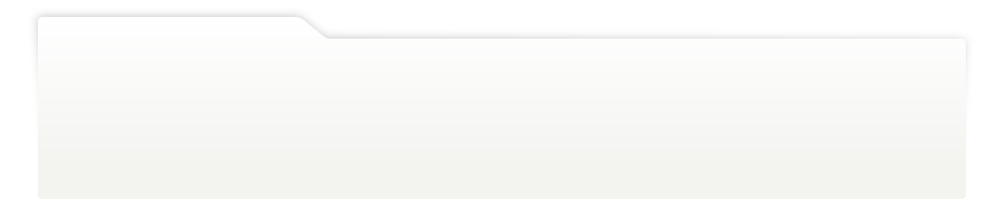
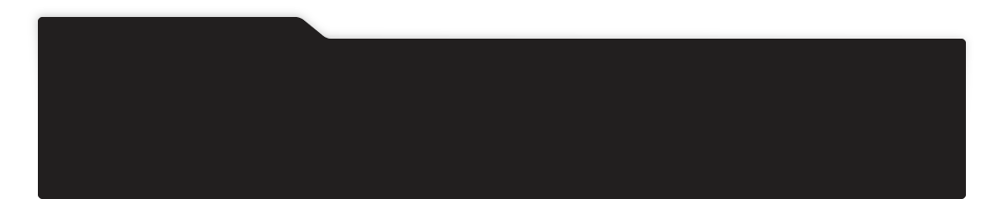
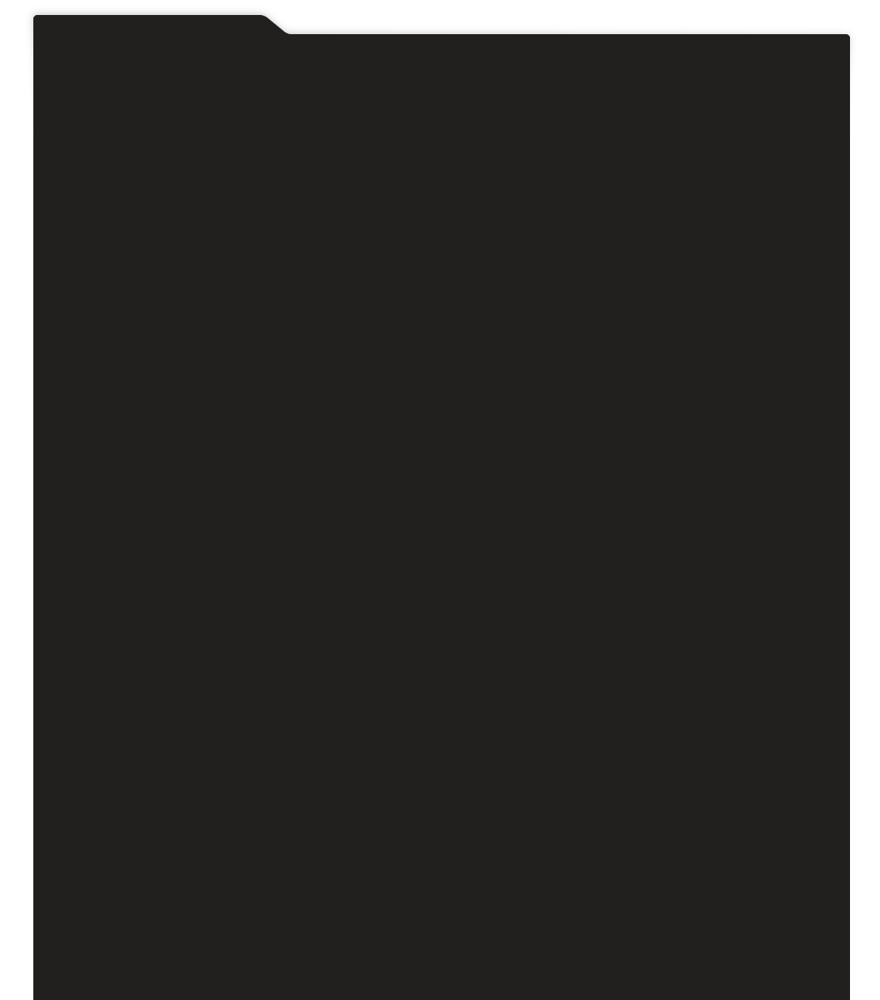
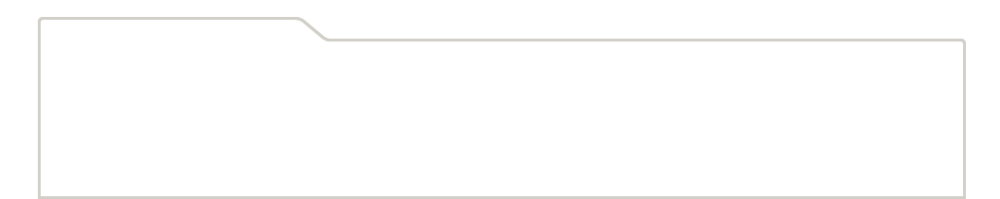
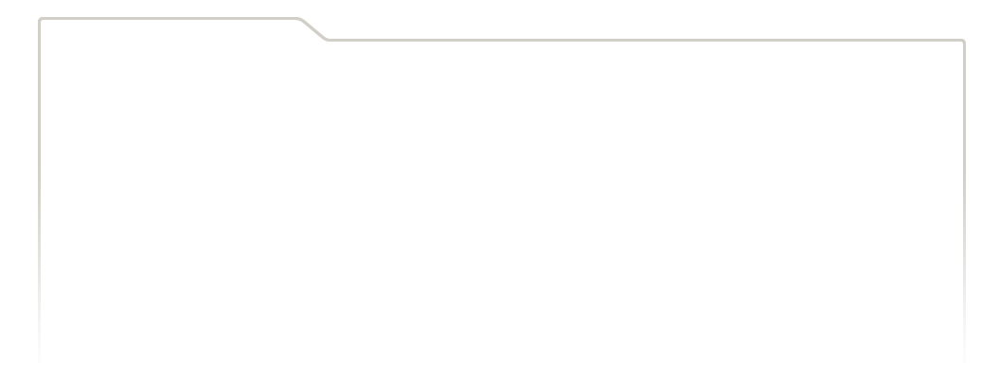
...
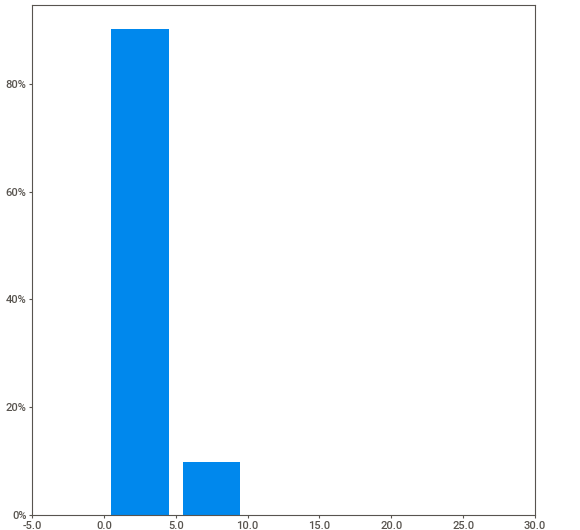
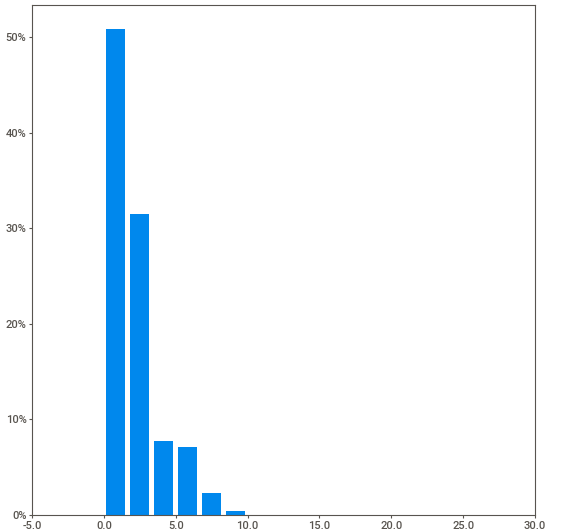
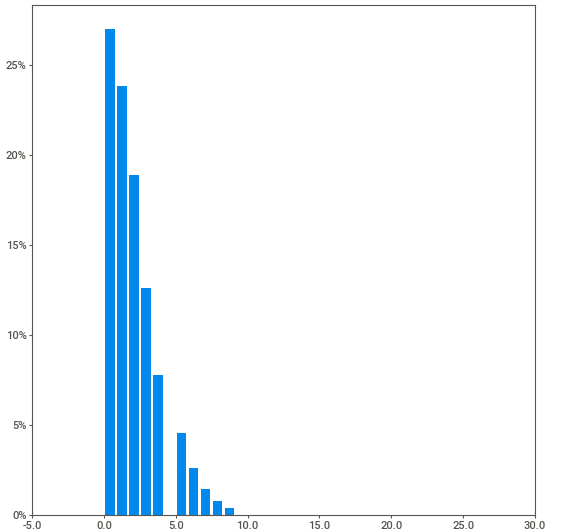
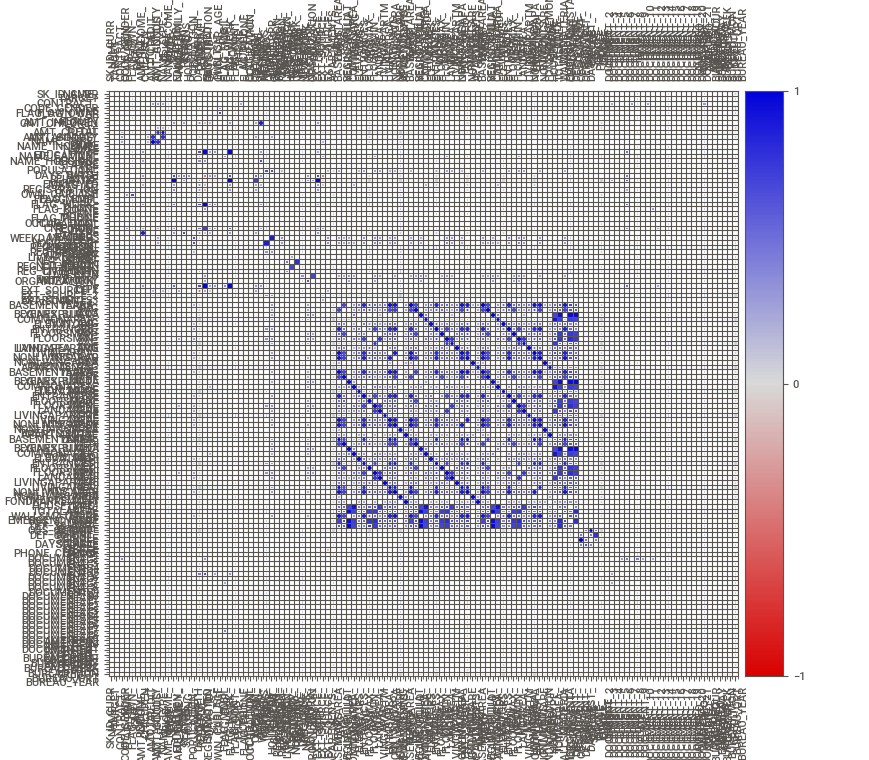
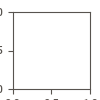

In [28]:
import IPython
IPython.display.HTML('analyze.html')

karena banyak tabelnya maka correlation hanya di highlight yang melebihi 0.5 atau kurang dari - 0.5

In [29]:
# Assuming you already have the correlation matrix
correlation_matrix = application_train.corr()

# Set the correlation threshold
threshold = 0.5

# Iterate over the correlation matrix
for column1 in correlation_matrix:
    for column2 in correlation_matrix:
        if column1 != column2:  # Avoid self-correlation
            correlation = correlation_matrix[column1][column2]
            if abs(correlation) > threshold:
                print(f"Correlation between {column1} and {column2}: {correlation}")

Correlation between CNT_CHILDREN and CNT_FAM_MEMBERS: 0.879160640438957
Correlation between AMT_CREDIT and AMT_ANNUITY: 0.7701380033118846
Correlation between AMT_CREDIT and AMT_GOODS_PRICE: 0.9869683054221499
Correlation between AMT_ANNUITY and AMT_CREDIT: 0.7701380033118846
Correlation between AMT_ANNUITY and AMT_GOODS_PRICE: 0.7751092733120319
Correlation between AMT_GOODS_PRICE and AMT_CREDIT: 0.9869683054221499
Correlation between AMT_GOODS_PRICE and AMT_ANNUITY: 0.7751092733120319
Correlation between REGION_POPULATION_RELATIVE and REGION_RATING_CLIENT: -0.5328765312383351
Correlation between REGION_POPULATION_RELATIVE and REGION_RATING_CLIENT_W_CITY: -0.5315354521931355
Correlation between DAYS_BIRTH and DAYS_EMPLOYED: -0.6158641964711599
Correlation between DAYS_BIRTH and FLAG_EMP_PHONE: 0.6198876962023361
Correlation between DAYS_BIRTH and EXT_SOURCE_1: -0.6006099739503155
Correlation between DAYS_EMPLOYED and DAYS_BIRTH: -0.6158641964711599
Correlation between DAYS_EMPLOYED an

- banyak data memiliki Missing Value yang sangat besar
- Target memiliki data yang sangat imbalanced sekali (0 = 92% , 1 = 8%) harus dihandle 
- 

In [5]:
missing_percentages = application_train.isnull().sum() / len(application_train) * 100
threshold = 30
columns_to_drop = missing_percentages[missing_percentages > threshold].index
application_train.drop(columns_to_drop, axis=1, inplace=True)



In [6]:
# memisahkan data 
X = application_train.drop(['TARGET'], axis=1)
y = application_train['TARGET']

In [7]:
# Train test split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=69,stratify=y)

print('Train Size : ', X_train.shape)
print('Test Size  : ', X_test.shape)
X_train

Train Size :  (261384, 71)
Test Size  :  (46127, 71)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
39555,145795,Cash loans,F,N,N,0,90000.0,517788.0,25312.5,427500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
94345,209544,Revolving loans,F,Y,Y,1,112500.0,225000.0,11250.0,225000.0,...,0,0,0,0,0.0,0.0,1.0,0.0,0.0,4.0
168110,294867,Cash loans,F,N,Y,1,112500.0,792346.5,26316.0,684000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
119264,238297,Cash loans,F,N,Y,1,157500.0,1575000.0,58500.0,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
69763,180931,Cash loans,F,N,Y,1,157500.0,625500.0,49549.5,625500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173853,301476,Cash loans,F,N,Y,0,99000.0,305221.5,14359.5,252000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,4.0
144011,266980,Cash loans,F,N,Y,4,158400.0,247275.0,21280.5,225000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
227909,363989,Cash loans,F,N,Y,0,90000.0,367389.0,16312.5,279000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
177004,305114,Cash loans,F,Y,Y,0,180000.0,1528200.0,53248.5,1350000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0


Best Hyperparameters: {'xgb__learning_rate': 0.1, 'xgb__max_depth': 5, 'xgb__n_estimators': 300}
Best Score: 0.02089959815007562


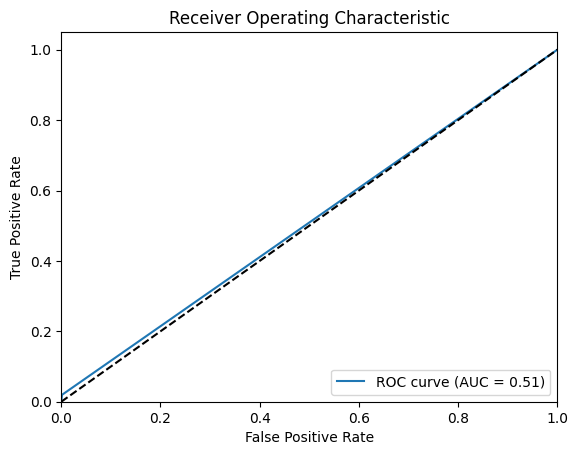

In [22]:

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.metrics import roc_curve, roc_auc_score
from xgboost import XGBClassifier



# Preprocessing steps for numeric and categorical columns
numeric_transformer = Pipeline([
    ('scaler', RobustScaler()),          # Apply RobustScaler to handle outliers
])

categorical_transformer = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Fill missing values with most frequent value
    ('encoder', OneHotEncoder())         # One-hot encode categorical features
])

# Combine the preprocessing steps using ColumnTransformer
preprocessor = ColumnTransformer([
    ('numeric', numeric_transformer, X_train.select_dtypes(include='number').columns),
    ('categorical', categorical_transformer, X_train.select_dtypes(include='object').columns)
])

# Create the XGBoost pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),     # Preprocessing steps
    ('xgb', XGBClassifier(tree_method='gpu_hist',nthread=-1))            # XGBoost model
])

# Define the hyperparameters to tune
param_grid = {
    'xgb__learning_rate': [0.1, 0.01, 0.001],
    'xgb__n_estimators': [100, 200, 300],
    'xgb__max_depth': [3, 4, 5]
}

# Perform grid search
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='recall')
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and best score
print('Best Hyperparameters:', grid_search.best_params_)
print('Best Score:', grid_search.best_score_)

# Get the best model
best_model = grid_search.best_estimator_

# Make predictions on the test data using the best model
y_pred = best_model.predict(X_test)

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
auc = roc_auc_score(y_test, y_pred)

# Plot ROC curve
plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


              precision    recall  f1-score   support

           0       0.92      1.00      0.96     42403
           1       0.54      0.02      0.04      3724

    accuracy                           0.92     46127
   macro avg       0.73      0.51      0.50     46127
weighted avg       0.89      0.92      0.88     46127



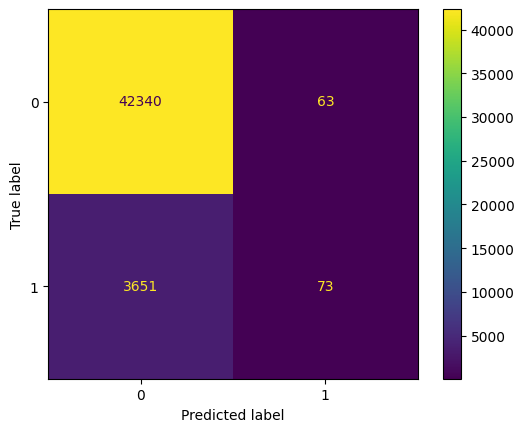

In [26]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay , classification_report

report = classification_report(y_test, y_pred)
print(report)

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

plt.show()

In [24]:
import joblib



# Save the model pipeline
joblib.dump(best_model, 'model_pipeline.pkl')

['model_pipeline.pkl']

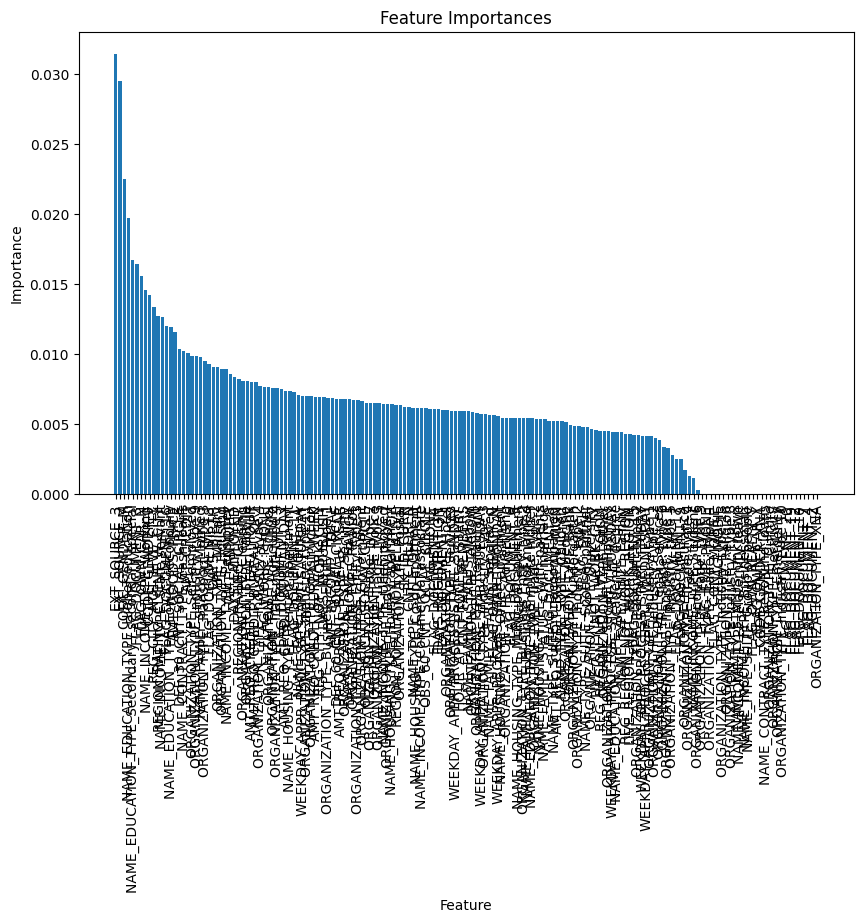

In [25]:

# Fit the pipeline on the training data
pipeline.fit(X_train, y_train)

# Get feature importances
importances = pipeline.named_steps['xgb'].feature_importances_

# Get feature names from the preprocessor
numeric_features = pipeline.named_steps['preprocessor'].transformers_[0][2]
categorical_features = pipeline.named_steps['preprocessor'].transformers_[1][1]['encoder'].get_feature_names_out(
    pipeline.named_steps['preprocessor'].transformers_[1][2]
)
feature_names = np.concatenate([numeric_features, categorical_features])

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(importances)), importances[indices])
plt.xticks(range(len(importances)), feature_names[indices], rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()


# select features using threshold
selection = SelectFromModel(model, threshold=thresh, prefit=True)
select_X_train = selection.transform(X_train)
# train model
selection_model = XGBClassifier()
selection_model.fit(select_X_train, y_train)
# eval model
select_X_test = selection.transform(X_test)
y_pred = selection_model.predict(select_X_test)

# fit model on all training data
model = MyXGBClassifier()
model.fit(X_train, y_train)
# make predictions for test data and evaluate
predictions = model.predict(X_test)
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
# Fit model using each importance as a threshold
thresholds = sort(model.feature_importances_)
for thresh in thresholds:
 # select features using threshold
 selection = SelectFromModel(model, threshold=thresh, prefit=True)
 select_X_train = selection.transform(X_train)
 # train model
 selection_model = XGBClassifier()
 selection_model.fit(select_X_train, y_train)
 # eval model
 select_X_test = selection.transform(X_test)
 predictions = selection_model.predict(select_X_test)
 accuracy = accuracy_score(y_test, predictions)
 print("Thresh=%.3f, n=%d, Accuracy: %.2f%%" % (thresh, select_X_train.shape[1], accuracy*100.0))